In [30]:
import pandas as pd
import numpy as np

In [301]:
from requests import Request, Session
from requests.exceptions import ConnectionError, Timeout, TooManyRedirects
import json

def get_quotes(symbol='BTC', interval='24h', time_start='2023-01-01T23:59:00.000Z', time_end='2024-08-28T23:59:00.000Z'):
    url = 'https://pro-api.coinmarketcap.com/v3/cryptocurrency/quotes/historical'
    parameters = {
      'symbol':symbol,
      'time_start': time_start,
      'time_end': time_end,
      'interval': interval,
      'convert':'USD',
      'count': '10000'
    }
    headers = {
      'Accepts': 'application/json',
      'X-CMC_PRO_API_KEY': 'a77de5b5-fa67-4cc5-85a5-1ca80de8abc1',
    }

    session = Session()
    session.headers.update(headers)

    try:
        response = session.get(url, params=parameters)
        data = json.loads(response.text)
        
        # Extract the relevant parts
        quotes_data = data['data'][symbol][0]['quotes']
    
        # Creating a DataFrame
        df = pd.DataFrame([{
            'symbol': symbol,
            **quote['quote']['USD']
            } for quote in quotes_data])
        
        print(f'{symbol} data downloaded')
        return df
    except (ConnectionError, Timeout, TooManyRedirects) as e:
        print(e)

In [317]:
symbols = ['BTC', 'ETH', 'SOL',
           'TON', 'SEI', 'SUI', 'WLD', 'ORDI', 'AR',
           'ONDO', 'ENA', 'MAVIA', 'PARAM', 'JUP', 'ALT', 'PIXEL', 'STRK', 'W',
           'DOGS', 'DOGE', 'BOME', 'WIF', 'BONK', 'SHIB', 'SLERF', 'NOT', 'FLOKI']

time_start='2022-01-01T23:59:00.000Z'

dfs = []
for symbol in symbols:
    dfs.append(get_quotes(symbol=symbol, time_start=time_start))

BTC data downloaded
ETH data downloaded
SOL data downloaded
TON data downloaded
SEI data downloaded
SUI data downloaded
WLD data downloaded
ORDI data downloaded
AR data downloaded
ONDO data downloaded
ENA data downloaded
MAVIA data downloaded
PARAM data downloaded
JUP data downloaded
ALT data downloaded
PIXEL data downloaded
STRK data downloaded
W data downloaded
DOGS data downloaded
DOGE data downloaded
BOME data downloaded
WIF data downloaded
BONK data downloaded
SHIB data downloaded
SLERF data downloaded
NOT data downloaded
FLOKI data downloaded


In [319]:
df_combined = pd.concat(dfs, ignore_index=True)
df_combined

,symbol,percent_change_1h,percent_change_24h,percent_change_7d,percent_change_30d,price,volume_24h,market_cap,total_supply,circulating_supply,timestamp
0,BTC,-0.044825,-0.842484,-7.007808,-11.779400,47284.213601,2.784727e+10,8.945342e+11,1.891824e+07,1.891824e+07,2022-01-03T00:00:00.000Z
1,BTC,0.542757,-1.647457,-8.149392,-5.876046,46505.226358,3.307100e+10,8.798379e+11,1.891912e+07,1.891912e+07,2022-01-04T00:00:00.000Z
2,BTC,-0.654050,-1.419885,-3.640323,-7.051994,45844.905623,4.243231e+10,8.673868e+11,1.892002e+07,1.892002e+07,2022-01-05T00:00:00.000Z
3,BTC,-0.169392,-5.269664,-6.492968,-14.197838,43429.033192,3.679932e+10,8.217199e+11,1.892098e+07,1.892098e+07,2022-01-06T00:00:00.000Z
4,BTC,-0.081356,-0.635658,-8.630752,-14.649575,43152.973171,3.004262e+10,8.165349e+11,1.892187e+07,1.892187e+07,2022-01-07T00:00:00.000Z
...,...,...,...,...,...,...,...,...,...,...,...
12393,FLOKI,-0.429964,6.669430,31.203053,-17.160764,0.000148,2.629980e+08,1.421583e+09,9.688393e+12,9.578711e+12,2024-08-24T00:00:00.000Z
12394,FLOKI,0.769540,3.506600,33.749883,-12.116150,0.000154,2.510757e+08,1.471400e+09,9.688186e+12,9.578504e+12,2024-08-25T00:00:00.000Z
12395,FLOKI,-0.652548,-2.167037,31.255387,-16.893356,0.000150,2.188529e+08,1.439509e+09,9.688149e+12,9.578467e+12,2024-08-26T00:00:00.000Z
12396,FLOKI,-0.523697,-1.363371,27.168506,-16.732098,0.000148,2.898003e+08,1.419878e+09,9.688117e+12,9.578436e+12,2024-08-27T00:00:00.000Z


In [321]:
df = df_combined.copy()

# Create the new column
df['volume_to_market_cap_ratio'] = df['volume_24h'] / (df['total_supply'] * df['price'])
df['circulating_supply_ratio'] = df['circulating_supply'] / (df['total_supply'])
df['log_price'] = np.log10(df['price'])

# Convert timestamp to datetime for proper plotting
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Filter the BTC data
btc_df = df[df['symbol'] == 'BTC'][['timestamp', 'volume_to_market_cap_ratio', 'price', 'log_price']].rename(
    columns={'volume_to_market_cap_ratio': 'btc_ratio', 'price': 'btc_price', 'log_price': 'log_btc_price'}
)

# Merge BTC ratio with the original dataframe
df = df.merge(btc_df, on='timestamp', how='left')

# Calculate the ratio of each symbol over BTC's ratio
df['ratio_over_btc'] = df['volume_to_market_cap_ratio'] / df['btc_ratio']
df['price_over_btc'] = df['price']/df['btc_price']
df['log_price_over_btc'] = df['log_price'] - df['log_btc_price']

# Display the first few rows of the updated dataframe
df[['symbol', 'timestamp', 'volume_to_market_cap_ratio', 'btc_ratio', 'ratio_over_btc', 'price_over_btc']].head()

,symbol,timestamp,volume_to_market_cap_ratio,btc_ratio,ratio_over_btc,price_over_btc
0,BTC,2022-01-03 00:00:00+00:00,0.031130,0.031130,1.0,1.0
1,BTC,2022-01-04 00:00:00+00:00,0.037588,0.037588,1.0,1.0
2,BTC,2022-01-05 00:00:00+00:00,0.048920,0.048920,1.0,1.0
3,BTC,2022-01-06 00:00:00+00:00,0.044783,0.044783,1.0,1.0
4,BTC,2022-01-07 00:00:00+00:00,0.036793,0.036793,1.0,1.0


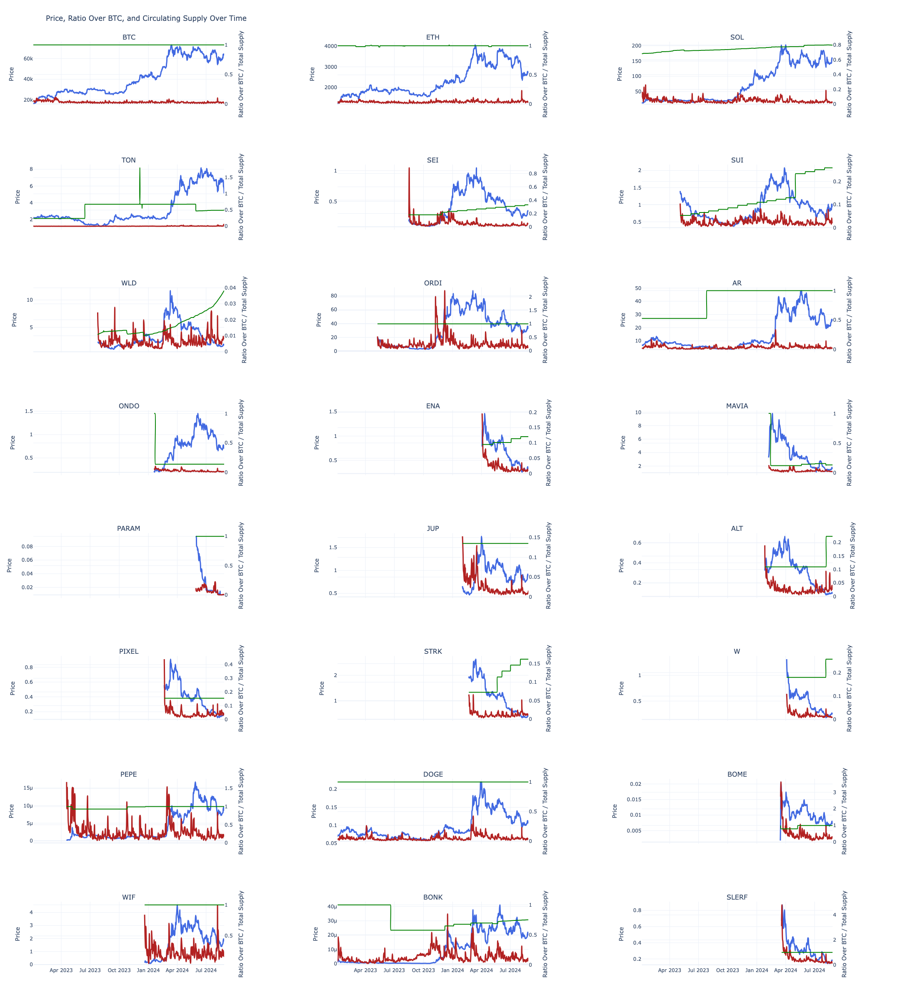

In [281]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create an 8x3 grid of subplots with secondary y-axes
fig = make_subplots(rows=8, cols=3, subplot_titles=df['symbol'].unique(), shared_xaxes=True, shared_yaxes=False,
                    specs=[[{"secondary_y": True} for _ in range(3)] for _ in range(8)])

# Loop through each symbol and add the three plots to the grid
symbols = df['symbol'].unique()
for i, symbol in enumerate(symbols[:24]):  # Limit to the first 24 symbols for 8x3 grid
    row = (i // 3) + 1
    col = (i % 3) + 1
    symbol_data = df[df['symbol'] == symbol]

    # Add price trace to the primary y-axis with smoother lines
    fig.add_trace(
        go.Scatter(x=symbol_data['timestamp'], y=symbol_data['price'], mode='lines', name=f'{symbol} Price', 
                   line=dict(color='royalblue', width=3), 
                   hoverinfo='x+y', 
                   line_shape='spline',  # Smoother line
                   connectgaps=True),
        row=row, col=col, secondary_y=False
    )

    # Add volume to market cap ratio trace to the secondary y-axis with a continuous line
    fig.add_trace(
        go.Scatter(x=symbol_data['timestamp'], y=symbol_data['volume_to_market_cap_ratio'], mode='lines', 
                   name=f'{symbol} Volume/Market Cap Ratio', 
                   line=dict(color='firebrick', width=3), 
                   hoverinfo='x+y', 
                   line_shape='spline',  # Smoother line
                   connectgaps=True),
        row=row, col=col, secondary_y=True
    )

    # Add circulating supply trace to the secondary y-axis
    fig.add_trace(
        go.Scatter(x=symbol_data['timestamp'], y=symbol_data['circulating_supply_ratio'], mode='lines', 
                   name=f'{symbol} Circulating Supply', 
                   line=dict(color='green', width=2), 
                   hoverinfo='x+y', 
                   line_shape='spline',  # Smoother line
                   connectgaps=True),
        row=row, col=col, secondary_y=True
    )

# Update layout to make it more interactive and larger with a light background
fig.update_layout(height=2400, width=2400, title_text="Price, Ratio Over BTC, and Circulating Supply Over Time",
                  showlegend=False, template="plotly_white",
                  xaxis=dict(matches='x1'))  # Synchronize x-axes across all rows

# Update axes properties
fig.update_yaxes(title_text="Price", secondary_y=False)
fig.update_yaxes(title_text="Ratio Over BTC / Total Supply", secondary_y=True)

# Show interactive plot
fig.show()

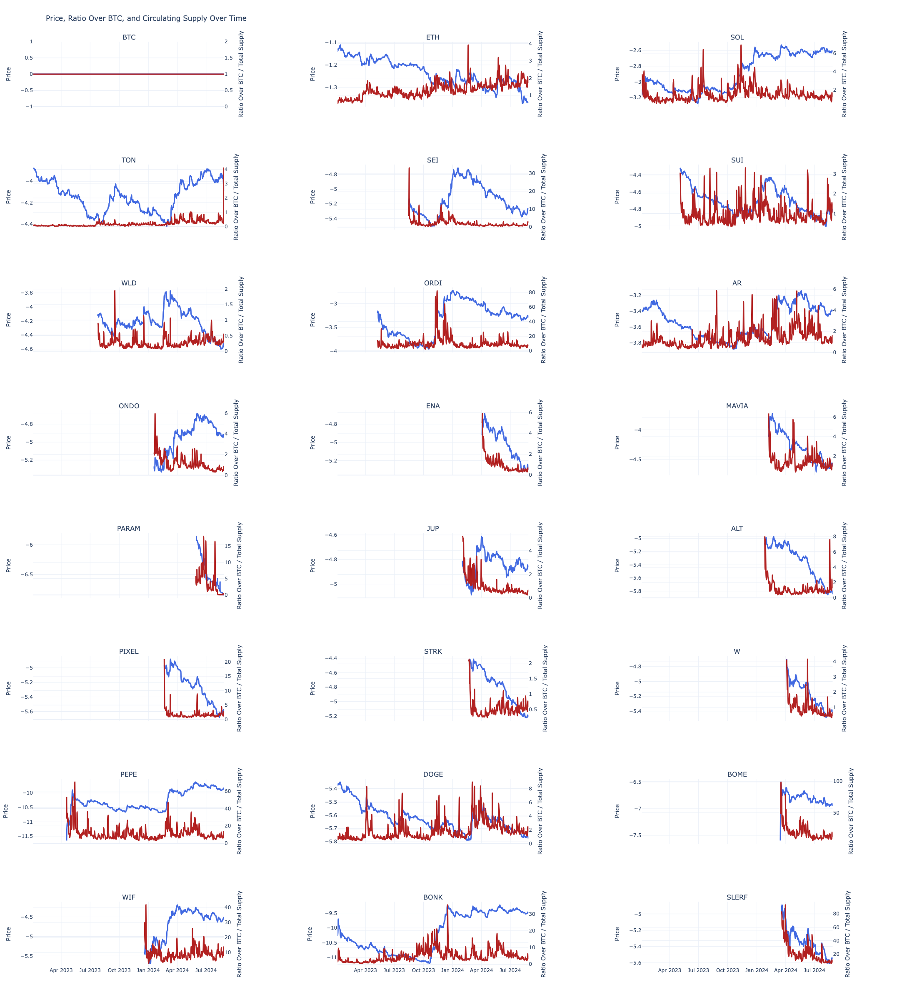

In [295]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create an 8x3 grid of subplots with secondary y-axes
fig = make_subplots(rows=8, cols=3, subplot_titles=df['symbol'].unique(), shared_xaxes=True, shared_yaxes=False,
                    specs=[[{"secondary_y": True} for _ in range(3)] for _ in range(8)])

# Loop through each symbol and add the three plots to the grid
symbols = df['symbol'].unique()
for i, symbol in enumerate(symbols[:24]):  # Limit to the first 24 symbols for 8x3 grid
    row = (i // 3) + 1
    col = (i % 3) + 1
    symbol_data = df[df['symbol'] == symbol]

    # Add price trace to the primary y-axis with smoother lines
    fig.add_trace(
        go.Scatter(x=symbol_data['timestamp'], y=symbol_data['log_price_over_btc'], mode='lines', name=f'{symbol} Price', 
                   line=dict(color='royalblue', width=3), 
                   hoverinfo='x+y', 
                   line_shape='spline',  # Smoother line
                   connectgaps=True),
        row=row, col=col, secondary_y=False
    )

    # Add volume to market cap ratio trace to the secondary y-axis with a continuous line
    fig.add_trace(
        go.Scatter(x=symbol_data['timestamp'], y=symbol_data['ratio_over_btc'], mode='lines', 
                   name=f'{symbol} Ratio over BTC', 
                   line=dict(color='firebrick', width=3), 
                   hoverinfo='x+y', 
                   line_shape='spline',  # Smoother line
                   connectgaps=True),
        row=row, col=col, secondary_y=True
    )

    # # Add circulating supply trace to the secondary y-axis
    # fig.add_trace(
    #     go.Scatter(x=symbol_data['timestamp'], y=symbol_data['circulating_supply_ratio']*20, mode='lines', 
    #                name=f'{symbol} Circulating Supply', 
    #                line=dict(color='green', width=2), 
    #                hoverinfo='x+y', 
    #                line_shape='spline',  # Smoother line
    #                connectgaps=True),
    #     row=row, col=col, secondary_y=True
    # )

# Update layout to make it more interactive and larger with a light background
fig.update_layout(height=2400, width=2400, title_text="Price, Ratio Over BTC, and Circulating Supply Over Time",
                  showlegend=False, template="plotly_white",
                  xaxis=dict(matches='x1'))  # Synchronize x-axes across all rows

# Update axes properties
fig.update_yaxes(title_text="Price", secondary_y=False)
fig.update_yaxes(title_text="Ratio Over BTC / Total Supply", secondary_y=True)

# Show interactive plot
fig.show()

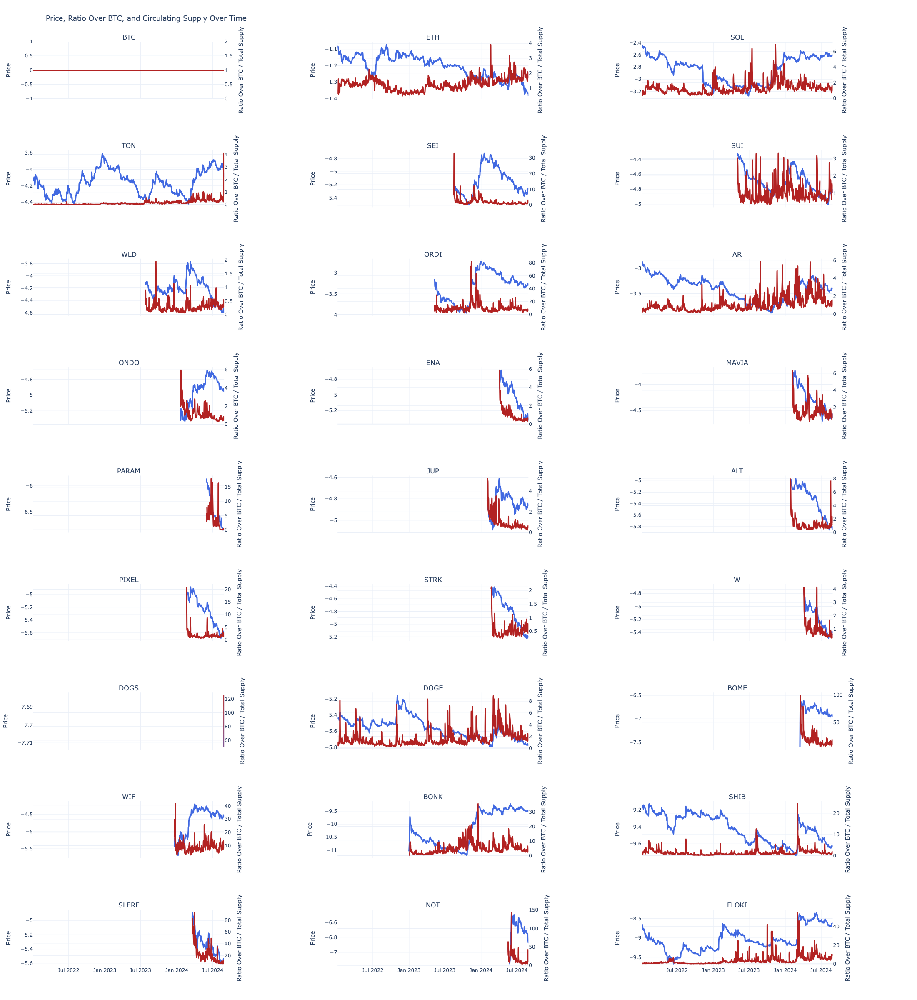

In [335]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create an 8x3 grid of subplots with secondary y-axes
fig = make_subplots(rows=9, cols=3, subplot_titles=df['symbol'].unique(), shared_xaxes=True, shared_yaxes=False,
                    specs=[[{"secondary_y": True} for _ in range(3)] for _ in range(9)])

# Loop through each symbol and add the three plots to the grid
symbols = df['symbol'].unique()
for i, symbol in enumerate(symbols[:27]):  # Limit to the first 24 symbols for 8x3 grid
    row = (i // 3) + 1
    col = (i % 3) + 1
    symbol_data = df[df['symbol'] == symbol]

    # Add price trace to the primary y-axis with smoother lines
    fig.add_trace(
        go.Scatter(x=symbol_data['timestamp'], y=symbol_data['log_price_over_btc'], mode='lines', name=f'{symbol} Price', 
                   line=dict(color='royalblue', width=3), 
                   hoverinfo='x+y', 
                   line_shape='spline',  # Smoother line
                   connectgaps=True),
        row=row, col=col, secondary_y=False
    )

    # Add volume to market cap ratio trace to the secondary y-axis with a continuous line
    fig.add_trace(
        go.Scatter(x=symbol_data['timestamp'], y=symbol_data['ratio_over_btc'], mode='lines', 
                   name=f'{symbol} Ratio over BTC', 
                   line=dict(color='firebrick', width=3), 
                   hoverinfo='x+y', 
                   line_shape='spline',  # Smoother line
                   connectgaps=True),
        row=row, col=col, secondary_y=True
    )

    # # Add circulating supply trace to the secondary y-axis
    # fig.add_trace(
    #     go.Scatter(x=symbol_data['timestamp'], y=symbol_data['circulating_supply_ratio']*20, mode='lines', 
    #                name=f'{symbol} Circulating Supply', 
    #                line=dict(color='green', width=2), 
    #                hoverinfo='x+y', 
    #                line_shape='spline',  # Smoother line
    #                connectgaps=True),
    #     row=row, col=col, secondary_y=True
    # )

# Update layout to make it more interactive and larger with a light background
fig.update_layout(height=2400, width=2400, title_text="Price, Ratio Over BTC, and Circulating Supply Over Time",
                  showlegend=False, template="plotly_white",
                  xaxis=dict(matches='x1'))  # Synchronize x-axes across all rows

# Update axes properties
fig.update_yaxes(title_text="Price", secondary_y=False)
fig.update_yaxes(title_text="Ratio Over BTC / Total Supply", secondary_y=True)

# Show interactive plot
fig.show()

笔记: 目前的尝试
1. 对比BTC的Ratio
2. 尝试Total Supply和Circulating Supply
3. 尝试Log Price
4. 将Supply变化画了出来

总结: 看不出太大的pattern
1. 兴趣下降, 一定会导致价格下降吗? 对比Meme, 似乎有兴趣会对价格有支撑
2. 兴趣上升, 价格就不会下降吗? Pixel, W, Alt似乎还是会下降
3. 价格上升会自然带来大家的兴趣, 因此往往价格上涨伴随着兴趣增加. 
4. 这就导致了一个因果问题, 那就是, 目前大家的兴趣点就在是否赚钱上, 只有涨过之后, 大家才会有兴趣. 兴趣是一个滞后的因素, 在这种假设下. 除非有其他的因素让人产生兴趣. (比如Meme Coin天然带话题)
5. 所以这里的假设就是, 兴趣来源有三个: 涨过的Coin, 刚开盘带话题的Coin, 然后就是牛市时候大家对整个市场的兴趣(板块轮动, AI, RWA, Meme, etc.)

对于第一个兴趣来源, 我们无法使用, 因为在那个假设下, 兴趣是滞后变量. 开盘带话题, 我们可以对开盘之后一段时间的量的变化进行建模. 对于牛市板块轮动, 那么我们需要监控整个市场交易量的变动, 把所有这些放到一起来看, 分析行业均值的因子.

Auto-correlation Price & Volume Factor; Topic-Factor; Market Factor/Sector Factor(Meme, RWA, etc).

另一种更简单的看法是, 第一个因子也算topic factor, 只是原因是价格上涨造成的. 因此一个做法是, 当一个币涨很夸张, 然后我们可以refresh it, 把它当作new launch token, 然后分析接下来几天的量的变化.(就和我们分析new launch token一样).
只是每个token的量的分析, 都需要做RV, 也即将市场的因素/板块的因素尽可能剔除出去, 然后决定是继续Long还是Short.

一个剔除市场因素, 做RV的方式是, 我们算某个币的Turnover(热度), 和自己过去比, 与行业均值的比, 与BTC的比, 观察其几天内的变化, 然后做出决定. (那些已经跌了很多我们没啥兴趣, 我们只关心那些突然涨了很多的, 然后决定是否需要加仓)

用这个量作为兴趣还有一个限制, 就是解锁量, 有一些token解锁也会带来热度突然上升(交易量上升), 这就是bad news带来的流量. (带来热度的消息不一定都是好消息)
1. 解决方法: 我们可以找那些全解锁的, 也即没啥坏新闻的, 减少noise影响
2. 我们还可以考虑不同的量来分析这个兴趣模型.

所以这种就是afterwards模型.

---
另外的几个额外观察:

1. 当热度上升到顶点(z-score相对于过去一段时间很大), 后续热度消退之后, 价格基本不会怎么上升
2. 热度总是一个滞后于价格的变量, 所以可以看到价格涨了, 热度没涨, 但很少看到热度比价格先涨的, 也即不要用热度去预测价格上升, 往往后半程是散户狂欢. 要卖在人声鼎沸时.
3. 以上变量适用于长期, 以及这个z-score需要足够显著独特, 并且最近(短期)不能出现连续的
4. 对于Meme Coin, 可以看到连续的兴趣, 这意味着长期支撑 (因此这就是为什么我们要求热度要足够独特)

如果一个coin, 热度是consistent的, 那么最好不要空, 它代表着一个长期兴趣在.
如果一个coin, 热度在某个时间到达最高潮, 非常迅猛, 并且之前一段时间都很平静, 那么可以考虑做空, 比如Pixel (所以是一个moving average cross?)

另外的问题是: 什么时候退出?
1. 当某个币相对价格上涨, 但是热度没涨? (这就意味着有人在偷偷买入? 热度会在之后才起来), 这个时候最好就是退出?

Trades: 当看到热度到达最高潮, 我们short, 然后检测热度和price, 我们期望的: 热度和price一起下降. 如果我们观察到price上升/没有快速下降, 或者热度回升且持续, 我们清理仓位;
但是如果热度高潮, 价格下跌呢? (似乎价格下跌的时候, 没有什么热度高潮...)


总结: 相对热度顶峰做空, 相对价格上涨, 相对热度没涨做多
一个绝对fact就是: 价格下跌不会带来热度, 价格上涨才会带来热度;

而我们乍一眼可能觉得热度上升之后, 接下来如果热度不回升了, 那么价格就会一直下降, 但是这个是false positive, 因为因果倒置, 因为不是热度低导致价格下降, 而是价格下降导致热度趋于平静了.
热度起来, 价格却没有起来的话, 这个才是有趣的地方.

几个逻辑:

价格上涨, 带动相对热度猛涨, 然后等待一周左右(价格也不会掉很多), 如果相对热度掉的很快, 那么入场做空

价格下降, 但是相对热度保持一个水平不变, 甚至在上涨, 那么表明有力量在支撑, 我们可以看情况入场做多

价格疯狂上涨, 但是相对热度保持一个水平不变, 甚至在上涨, 那么表明有力量在支撑, 我们可以看情况入场做多

持续的流入/兴趣才是一个币保持长期增长的要素, 短期的兴趣是毒药(更多投机者进入)



----
总结, 兴趣上升不一定会涨, 但是兴趣降低大概率会跌.

因果关系: 上涨 -> 增加大家兴趣; 下跌 -> 减少大家的兴趣

发现:
1. 持续的兴趣会有一个长期支撑作用, 不至于衰减太严重 (比如Meme)
2. 如果兴趣衰减很快, 那么后续大概率不太行 (后面交易量相比第一天差距太大)
    2.1 如果兴趣衰减没那么直接(一周内有反弹, 那么可能还有故事), 比如ONDO, WLD, 
3. 但是, 如果后面又面临一个新的时期 (是整体时期的变换), 那么可能一些币会起死回生, 比如ORDI和SEI
    3.1 更多跟时期有关, 不同时期发行的代币, 可能有不同的形状
    3.2 比如今年的, 很多就跟ENA一样, 兴趣很快衰减
    3.3 去年的, 前期差不多, 但是参考SEI和ORDI崛起的时间, 其实很重合. 所以, 一个假设是, 大家的兴趣时间点比较集中(板块集中轮动)
    3.4 比如ENA和JUP后半部分, 其实两者趋势几乎一样, 只不过JUP比ENA提前发布而已
    
一个策略是, 根据兴趣衰减的程度做RV (不过就是需要注意的是, 刚推出的时候, 兴趣自然会不一样)

然后还有一点是filter:
1. filter那些交易量小的代币


一般兴趣 = 市场整体兴趣 + 单token兴趣
首日兴趣 = 市场整体兴趣 + 单token兴趣 + 首日Volume效应(MM参与, 宣传, 兴趣等等)
数据: 交易量, 市值(流通量)

In [333]:
df[df['symbol']=='FLOKI'][-30:]

,symbol,percent_change_1h,percent_change_24h,percent_change_7d,percent_change_30d,price,volume_24h,market_cap,total_supply,circulating_supply,timestamp,volume_to_market_cap_ratio,circulating_supply_ratio,log_price,btc_ratio,btc_price,log_btc_price,ratio_over_btc,price_over_btc,log_price_over_btc
12368,FLOKI,-0.534912,-0.400253,-10.993932,5.148602,0.000172,1.741144e+08,1.648479e+09,9.689376e+12,9.570203e+12,2024-07-30 00:00:00+00:00,0.104322,0.987701,-3.763838,0.030951,66786.768107,4.824690,3.370564,2.579122e-09,-8.588528
12369,FLOKI,-0.001011,-2.935523,-9.744648,-2.347252,0.000167,1.480116e+08,1.600390e+09,9.689374e+12,9.572010e+12,2024-07-31 00:00:00+00:00,0.091364,0.987887,-3.776777,0.024026,66187.629758,4.820777,3.802655,2.526073e-09,-8.597554
12370,FLOKI,-1.093681,-3.465683,-9.910232,-5.188382,0.000161,1.704316e+08,1.544924e+09,9.689364e+12,9.572001e+12,2024-08-01 00:00:00+00:00,0.108981,0.987887,-3.792096,0.024553,64630.864610,4.810440,4.438663,2.497264e-09,-8.602536
12371,FLOKI,0.756383,-2.304407,-9.789854,-13.782803,0.000158,2.038419e+08,1.509322e+09,9.689359e+12,9.571996e+12,2024-08-02 00:00:00+00:00,0.133419,0.987887,-3.802221,0.031812,65306.317468,4.814955,4.194025,2.414483e-09,-8.617176
12372,FLOKI,-0.001875,-10.484131,-21.945690,-13.104468,0.000141,2.061982e+08,1.351074e+09,9.689298e+12,9.571935e+12,2024-08-03 00:00:00+00:00,0.150769,0.987887,-3.850321,0.035528,61416.251834,4.788283,4.243662,2.298244e-09,-8.638604
12373,FLOKI,0.077801,-7.345122,-26.536971,-8.083803,0.000131,1.839815e+08,1.251835e+09,9.689290e+12,9.571927e+12,2024-08-04 00:00:00+00:00,0.145189,0.987887,-3.883452,0.026504,60676.175070,4.783018,5.477954,2.155408e-09,-8.666471
12374,FLOKI,-2.047420,-6.777580,-29.504085,-12.062932,0.000122,1.949413e+08,1.166988e+09,9.689271e+12,9.571907e+12,2024-08-05 00:00:00+00:00,0.165023,0.987887,-3.913932,0.027687,58143.096707,4.764498,5.960387,2.096862e-09,-8.678430
12375,FLOKI,-0.842557,-9.513323,-35.954244,-27.504648,0.000110,4.913884e+08,1.055955e+09,9.689140e+12,9.571776e+12,2024-08-06 00:00:00+00:00,0.459713,0.987887,-3.957347,0.102241,54004.317594,4.732428,4.496350,2.042792e-09,-8.689776
12376,FLOKI,-0.656227,9.600196,-27.682840,-11.288931,0.000121,2.400310e+08,1.157649e+09,9.689130e+12,9.574426e+12,2024-08-07 00:00:00+00:00,0.204889,0.988162,-3.917536,0.044566,56061.518862,4.748665,4.597428,2.156747e-09,-8.666201
12377,FLOKI,-0.815032,-2.527522,-26.980031,-16.946877,0.000118,3.327384e+08,1.128379e+09,9.689048e+12,9.574345e+12,2024-08-08 00:00:00+00:00,0.291391,0.988162,-3.928654,0.038250,55139.547667,4.741463,7.618143,2.137385e-09,-8.670117
